# Risk Factor Distributions by Fibrosis Level

**Prerequisite:** Run `01_download_nhanes_lsm.ipynb` first to populate `../data/derived/`.

This notebook examines how four cardiovascular/metabolic risk factors — **SBP**, **LDL-C**,
**fasting plasma glucose (FPG)**, and **BMI** — are distributed across liver fibrosis
levels defined by transient elastography (LSM, kPa) in pooled NHANES 2017–2020 pre-pandemic
and 2021–2022 data.

**Fibrosis staging** (METAVIR-equivalent LSM cutoffs, general-population estimates):

| Stage | LSM range | Interpretation |
|-------|-----------|---------------|
| F0 | < 5.5 kPa | No fibrosis |
| F1 | 5.5 – 7.0 kPa | Mild fibrosis |
| F2 | 7.1 – 9.4 kPa | Significant fibrosis |
| F3+ | ≥ 9.5 kPa | Severe fibrosis / cirrhosis |

**Sections:**
1. Data loading and preparation (merge LDL-C, FPG from fasting subsample)
2. Histograms: overall vs. fibrosis-stratified distributions
3. KDE plots: same comparison with density curves
4. Age-sex percentiles of each risk factor
5. 2D UMAP embedding of joint percentile distribution, colored by fibrosis level
6. Animated GIF linking 2D embedding to marginal distributions

In [1]:
import os, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pyreadstat

warnings.filterwarnings('ignore', category=FutureWarning)

DATA_DIR   = os.path.abspath(os.path.join('..', 'data'))
RAW_NHANES = os.path.join(DATA_DIR, 'raw', 'nhanes')
DERIVED    = os.path.join(DATA_DIR, 'derived')

# Fibrosis stage cutoffs (kPa)
F0_UPPER = 5.5
F1_UPPER = 7.0
F2_UPPER = 9.5  # F3+ starts here

FIBROSIS_LABELS = ['F0', 'F1', 'F2', 'F3+']

RISK_FACTORS = {
    'SBP_MEAN': {'label': 'SBP (mmHg)', 'unit': 'mmHg'},
    'LDL_C':    {'label': 'LDL-C (mg/dL)', 'unit': 'mg/dL'},
    'FPG':      {'label': 'Fasting Plasma Glucose (mg/dL)', 'unit': 'mg/dL'},
    'BMXBMI':   {'label': 'BMI (kg/m²)', 'unit': 'kg/m²'},
}

print('Setup complete.')

Setup complete.


In [2]:
# ═══════════════════════════════════════════════════════════════════════
# STYLE PARAMETERS — adjust these and re-run to restyle every plot
# ═══════════════════════════════════════════════════════════════════════

# Colormap for continuous (percentile) data
CMAP = 'viridis'

# Fibrosis level colors
FIBROSIS_COLORS = {
    'F0':  '#1a9641',   # green
    'F1':  '#d4a017',   # amber
    'F2':  '#d95f02',   # orange
    'F3+': '#c00020',   # red
}

# ── Histograms ──────────────────────────────────────────────────────
HIST_BINS       = 35
HIST_BG_COLOR   = '#c8c8c8'    # overall distribution fill
HIST_FIB_ALPHA  = 0.85         # fibrosis overlay opacity

# ── KDE plots ──────────────────────────────────────────────────────
KDE_FIB_LW      = 3.0          # fibrosis level curves
KDE_OVERALL_LW  = 2.5          # overall dashed curve
KDE_FILL_ALPHA  = 0.08         # overall fill-under

# ── UMAP static panels (fibrosis-level) ───────────────────────────
UMAP_BG_SIZE    = 3             # gray background markers
UMAP_BG_ALPHA   = 0.10
UMAP_FG_SIZE    = 8             # colored fibrosis markers
UMAP_FG_ALPHA   = 0.6

# ── UMAP static panels (percentile-colored) ──────────────────────
UMAP_PCT_SIZE   = 5
UMAP_PCT_ALPHA  = 0.6

# ── Animation: UMAP panel ─────────────────────────────────────────
ANIM_BG_SIZE    = 8             # BMI-colored background (marker area, pt²)
ANIM_BG_ALPHA   = 0.8
ANIM_GRP_SIZE   = 30            # fibrosis-group gray outlines (marker area)
ANIM_GRP_LW     = 1.0           # gray outline stroke width
ANIM_GRP_ALPHA  = 0.5
ANIM_SEL_SIZE   = 350           # selected-individual red outline (marker area)
ANIM_SEL_LW     = 3.5           # red outline stroke width

# ── Animation: right-side scatter plots ───────────────────────────
ANIM_SC_SIZE    = 5             # background scatter markers
ANIM_SC_ALPHA   = 0.30
ANIM_SC_SEL_SZ  = 220          # selected individual marker
ANIM_SC_SEL_LW  = 3.5          # selected individual stroke width

# ── Animation: connecting arrows ──────────────────────────────────
ANIM_ARR_LW     = 2.0
ANIM_ARR_ALPHA  = 0.7
ANIM_ARR_COLOR  = 'red'
ANIM_ARR_RAD    = 0.15         # arc curvature

# ── Font sizes (all plots) ────────────────────────────────────────
FONT_TITLE      = 15
FONT_SUBTITLE   = 13
FONT_LABEL      = 12
FONT_TICK        = 11
FONT_LEGEND     = 11

# ── GIF settings ──────────────────────────────────────────────────
GIF_DURATION_MS = 1500
GIF_N_PER_LEVEL = 8
GIF_DPI         = 100

# Apply global rcParams
plt.rcParams.update({
    'figure.dpi': 120,
    'figure.facecolor': 'white',
    'font.size': FONT_TICK,
    'axes.titlesize': FONT_SUBTITLE,
    'axes.labelsize': FONT_LABEL,
    'xtick.labelsize': FONT_TICK,
    'ytick.labelsize': FONT_TICK,
    'legend.fontsize': FONT_LEGEND,
})

print('Style parameters loaded.')

Style parameters loaded.


## 1. Load and prepare data

Pool the two non-overlapping LSM cycles (2017–2020 pre-pandemic and 2021–2022).
Merge LDL-C (from TRIGLY component, Friedewald calculation) and fasting plasma glucose
(from GLU component) — both are available only for the fasting subsample (~half of
examined adults).

In [3]:
def read_xpt(path):
    try:
        df, _ = pyreadstat.read_xport(path)
    except UnicodeDecodeError:
        df, _ = pyreadstat.read_xport(path, encoding='latin1')
    return df

# --- Load base parquets (demographics + LSM + SBP + BMI) ---
cycles = [
    {'parquet': '2017_2020_prepandemic', 'raw_dir': '2017_2020_prepandemic',
     'trigly': 'P_TRIGLY.xpt', 'glu': 'P_GLU.xpt'},
    {'parquet': '2021_2022', 'raw_dir': '2021_2022',
     'trigly': 'TRIGLY_L.xpt', 'glu': 'GLU_L.xpt'},
]

frames = []
for cyc in cycles:
    df = pd.read_parquet(os.path.join(DERIVED, f"{cyc['parquet']}.parquet"))
    raw_dir = os.path.join(RAW_NHANES, cyc['raw_dir'])

    # Merge LDL-C (Friedewald) from TRIGLY
    trigly = read_xpt(os.path.join(raw_dir, cyc['trigly']))
    df = df.merge(trigly[['SEQN', 'LBDLDL']].rename(columns={'LBDLDL': 'LDL_C'}),
                  on='SEQN', how='left')

    # Merge fasting plasma glucose from GLU
    glu = read_xpt(os.path.join(raw_dir, cyc['glu']))
    df = df.merge(glu[['SEQN', 'LBXGLU']].rename(columns={'LBXGLU': 'FPG'}),
                  on='SEQN', how='left')

    frames.append(df)
    print(f"{cyc['parquet']}: {len(df):,} adults, "
          f"LDL-C: {df['LDL_C'].notna().sum():,}, FPG: {df['FPG'].notna().sum():,}")

pool = pd.concat(frames, ignore_index=True)
print(f"\nPooled: {len(pool):,} adults")

# --- Valid LSM (IQR/median ≤ 0.30) ---
pool = pool[
    pool['LSM_KPA'].notna() &
    (pool['LSM_KPA'] > 0) &
    (pool['LSM_IQR_RATIO'].isna() | (pool['LSM_IQR_RATIO'] <= 0.30))
].copy()
print(f"After LSM quality filter: {len(pool):,}")

# --- Fibrosis staging ---
pool['FIBROSIS'] = pd.cut(
    pool['LSM_KPA'],
    bins=[0, F0_UPPER, F1_UPPER, F2_UPPER, np.inf],
    labels=FIBROSIS_LABELS,
    right=False,
)

# Age groups for percentile calculation
pool['AGE_GROUP'] = pd.cut(pool['AGE'], bins=[18, 30, 40, 50, 60, 70, 120],
                           labels=['18-29', '30-39', '40-49', '50-59', '60-69', '70+'])

print('\nFibrosis distribution:')
print(pool['FIBROSIS'].value_counts().sort_index())
print(f"\nRisk factor availability (non-null):")
for col, info in RISK_FACTORS.items():
    n = pool[col].notna().sum()
    print(f"  {info['label']}: {n:,} ({n/len(pool)*100:.0f}%)")

2017_2020_prepandemic: 8,965 adults, LDL-C: 4,068, FPG: 4,173


2021_2022: 6,337 adults, LDL-C: 3,152, FPG: 3,329

Pooled: 15,302 adults


After LSM quality filter: 13,791

Fibrosis distribution:
FIBROSIS
F0     8377
F1     3103
F2     1334
F3+     977
Name: count, dtype: int64

Risk factor availability (non-null):
  SBP (mmHg): 12,933 (94%)
  LDL-C (mg/dL): 6,559 (48%)
  Fasting Plasma Glucose (mg/dL): 6,818 (49%)
  BMI (kg/m²): 13,679 (99%)


## 2. Histograms: overall vs. fibrosis-stratified distributions

One figure per risk factor (slide-ready). Each shows the overall population
distribution (gray) with the distribution for each fibrosis level overlaid.

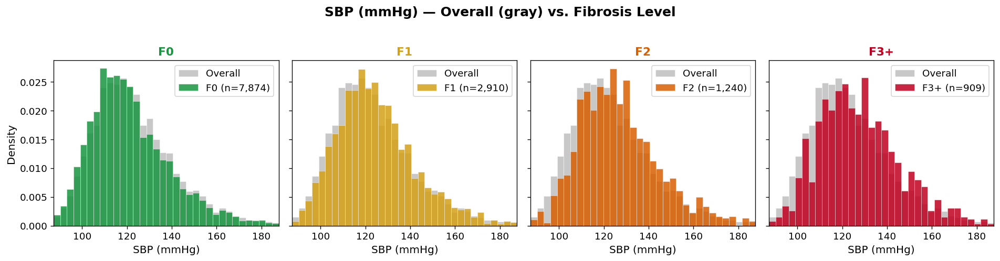

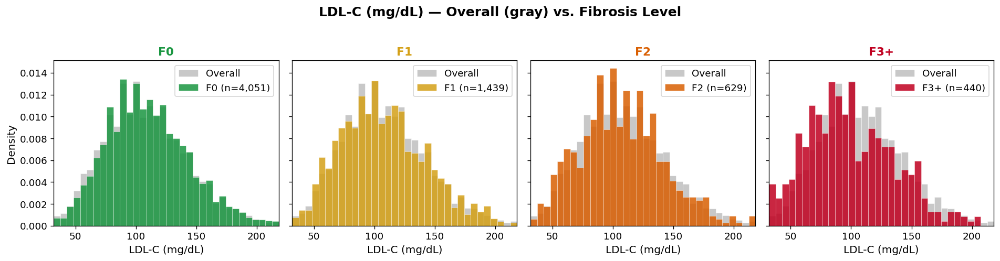

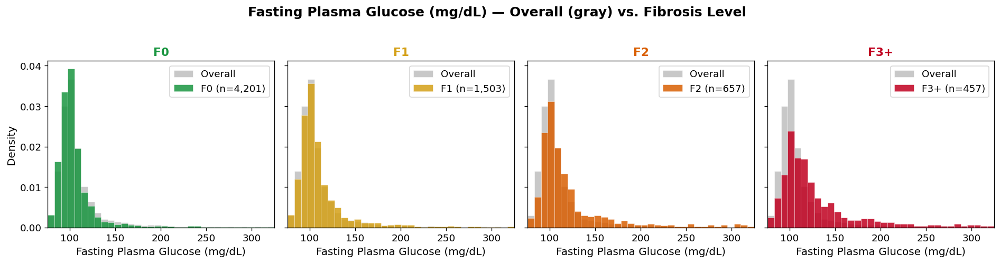

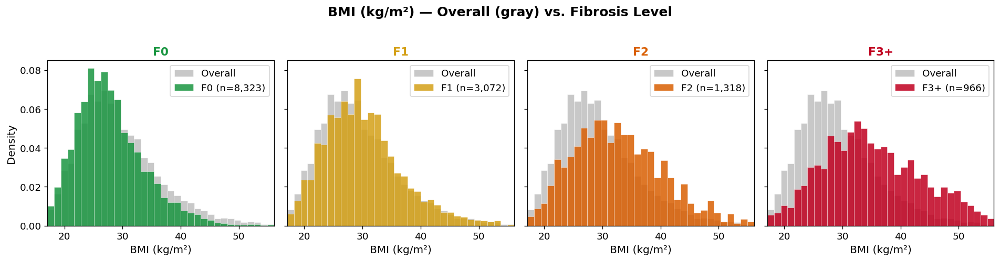

In [4]:
for col, info in RISK_FACTORS.items():
    fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=True)
    vals_all = pool[col].dropna()
    lo, hi = vals_all.quantile(0.005), vals_all.quantile(0.995)
    bins = np.linspace(lo, hi, HIST_BINS)

    for ax, fib in zip(axes, FIBROSIS_LABELS):
        vals_fib = pool.loc[pool['FIBROSIS'] == fib, col].dropna()

        ax.hist(vals_all, bins=bins, density=True, color=HIST_BG_COLOR,
                edgecolor='white', linewidth=0.3, label='Overall', zorder=1)
        ax.hist(vals_fib, bins=bins, density=True, color=FIBROSIS_COLORS[fib],
                edgecolor='white', linewidth=0.3, alpha=HIST_FIB_ALPHA,
                label=f'{fib} (n={len(vals_fib):,})', zorder=2)

        ax.set_title(fib, fontsize=FONT_SUBTITLE, fontweight='bold',
                     color=FIBROSIS_COLORS[fib])
        ax.set_xlabel(info['label'])
        ax.legend(loc='upper right')
        ax.set_xlim(lo, hi)

    axes[0].set_ylabel('Density')
    fig.suptitle(f'{info["label"]} — Overall (gray) vs. Fibrosis Level',
                 fontsize=FONT_TITLE, fontweight='bold', y=1.03)
    fig.tight_layout()
    plt.show()

## 3. KDE plots: density comparison

One figure per risk factor. Each overlays all four fibrosis levels against the
overall population density (dashed gray).

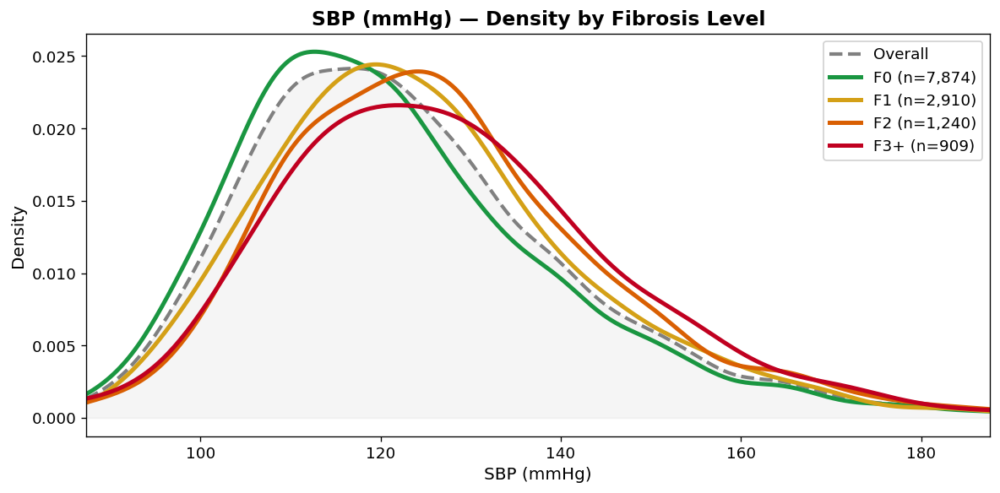

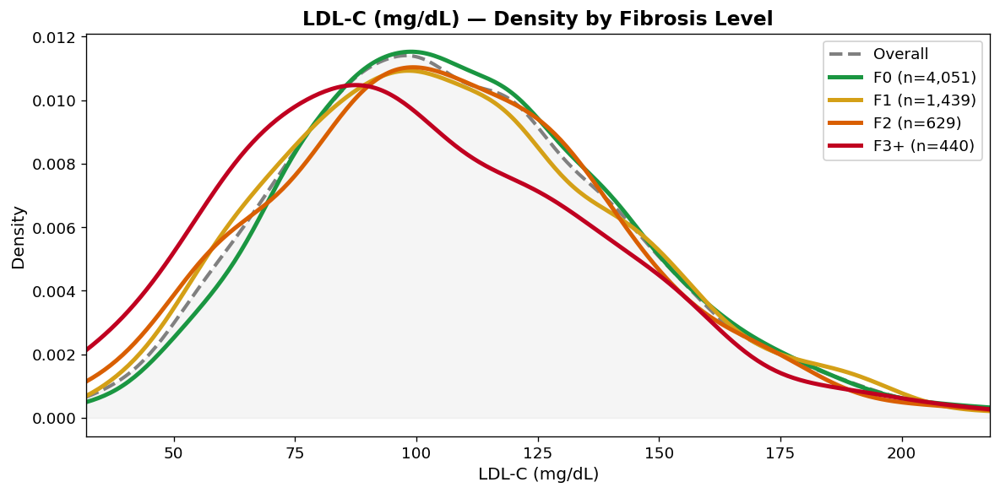

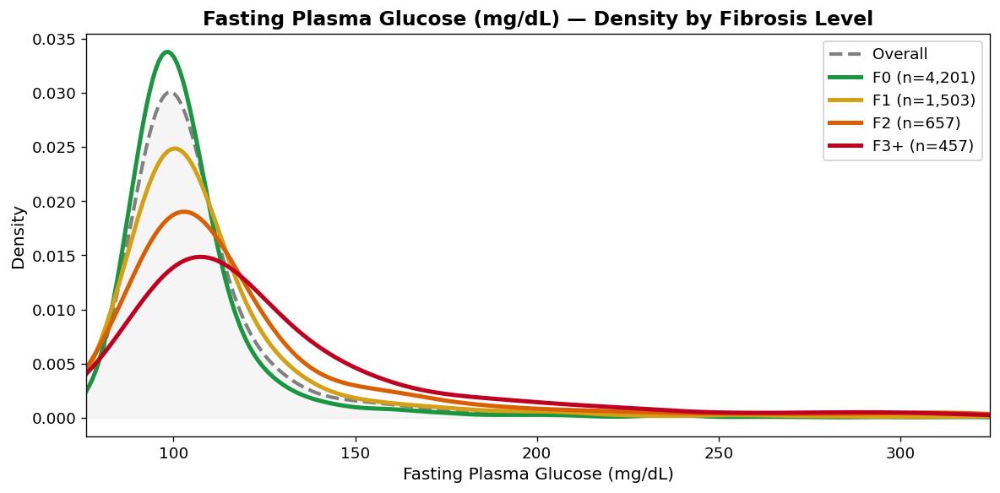

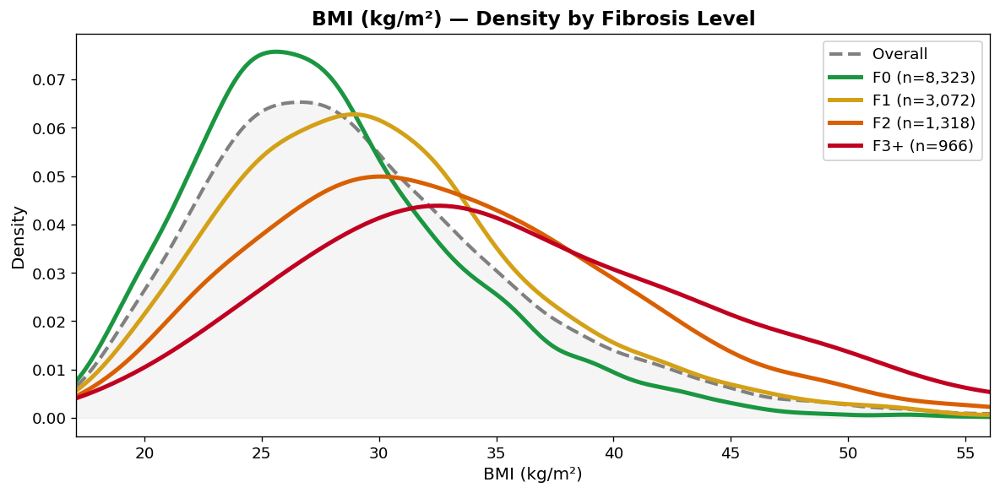

In [5]:
for col, info in RISK_FACTORS.items():
    fig, ax = plt.subplots(figsize=(10, 5))
    vals_all = pool[col].dropna()
    lo, hi = vals_all.quantile(0.005), vals_all.quantile(0.995)
    grid = np.linspace(lo, hi, 300)

    # Overall KDE
    kde_all = stats.gaussian_kde(vals_all)
    ax.plot(grid, kde_all(grid), color='gray', ls='--', lw=KDE_OVERALL_LW,
            label='Overall', zorder=1)
    ax.fill_between(grid, kde_all(grid), color='gray', alpha=KDE_FILL_ALPHA, zorder=0)

    # Per-fibrosis KDE
    for fib in FIBROSIS_LABELS:
        vals = pool.loc[pool['FIBROSIS'] == fib, col].dropna()
        if len(vals) < 10:
            continue
        kde = stats.gaussian_kde(vals)
        ax.plot(grid, kde(grid), color=FIBROSIS_COLORS[fib], lw=KDE_FIB_LW,
                label=f'{fib} (n={len(vals):,})', zorder=2)

    ax.set_title(f'{info["label"]} — Density by Fibrosis Level',
                 fontsize=FONT_SUBTITLE + 1, fontweight='bold')
    ax.set_xlabel(info['label'])
    ax.set_xlim(lo, hi)
    ax.set_ylabel('Density')
    ax.legend(framealpha=0.9)
    fig.tight_layout()
    plt.show()

## 4. Age- and sex-stratified percentiles

To compare risk across individuals with different demographics, we compute
within-stratum percentiles: for each person, the percentile of their SBP, LDL-C,
FPG, and BMI relative to others of the same age group and sex. This removes
confounding by age and sex so that we can examine how fibrosis relates to
*relative* cardiometabolic risk position.

In [6]:
rf_cols = list(RISK_FACTORS.keys())

# Compute within age-group × sex percentiles
for col in rf_cols:
    pctile_col = f'{col}_pctile'
    pool[pctile_col] = np.nan
    for (ag, sex), idx in pool.groupby(['AGE_GROUP', 'SEX']).groups.items():
        vals = pool.loc[idx, col]
        valid = vals.notna()
        if valid.sum() < 10:
            continue
        pool.loc[idx[valid], pctile_col] = vals[valid].rank(pct=True) * 100

pctile_cols = [f'{c}_pctile' for c in rf_cols]

# Show median percentile by fibrosis level (should be ~50 if no association)
summary = pool.groupby('FIBROSIS')[pctile_cols].agg(['median', 'mean', 'count']).round(1)
summary.columns = [f'{c.replace("_pctile","")}_{s}' for c, s in summary.columns]
display(summary)

print("\nMedian percentile above 50 → that fibrosis level has higher-than-expected risk.")

,SBP_MEAN_median,SBP_MEAN_mean,SBP_MEAN_count,LDL_C_median,LDL_C_mean,LDL_C_count,FPG_median,FPG_mean,FPG_count,BMXBMI_median,BMXBMI_mean,BMXBMI_count
FIBROSIS,,,,,,,,,,,,
F0,47.8,48.5,7874,52.1,51.5,4051,45.4,46.8,4201,42.3,44.1,8323
F1,52.2,51.8,2910,49.0,49.5,1439,51.6,52.2,1503,56.7,54.0,3072
F2,55.2,53.6,1240,47.6,48.1,629,61.7,57.6,657,69.3,63.0,1318
F3+,55.1,52.7,909,36.7,42.2,440,70.4,63.1,457,81.7,71.5,966



Median percentile above 50 → that fibrosis level has higher-than-expected risk.


## 5. Joint percentile distribution — 2D UMAP embedding

Each person with complete data is a point in 4D percentile space
(SBP, LDL-C, FPG, BMI percentiles). We use **supervised UMAP**, which
incorporates the fibrosis label as a soft target during embedding so that
individuals with the same fibrosis level cluster more tightly. The
`target_weight` parameter controls how much the labels influence layout
(0 = unsupervised, 1 = fully label-driven); 0.3 strikes a balance that
reveals genuine risk-profile structure while making fibrosis-level
separation visible.

In [7]:
import umap

# Restrict to complete cases (all 4 percentiles non-null)
complete = pool.dropna(subset=pctile_cols).copy()
print(f"Complete cases (all 4 risk factors): {len(complete):,}")
print(f"Fibrosis distribution in complete cases:")
print(complete['FIBROSIS'].value_counts().sort_index())

X = complete[pctile_cols].values

# Encode fibrosis as ordinal target for supervised UMAP
fibrosis_ord = complete['FIBROSIS'].cat.codes.values

reducer = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean',
                    target_weight=0.3, random_state=42)
embedding = reducer.fit_transform(X, y=fibrosis_ord)
complete['UMAP1'] = embedding[:, 0]
complete['UMAP2'] = embedding[:, 1]

# Orient so that low BMI percentile is on the left (negative UMAP1)
bmi_corr = np.corrcoef(complete['BMXBMI_pctile'], complete['UMAP1'])[0, 1]
if bmi_corr < 0:
    complete['UMAP1'] = -complete['UMAP1']
    print(f"Flipped UMAP1 (BMI correlation was {bmi_corr:.2f}, now positive)")
else:
    print(f"UMAP1 already oriented with BMI (correlation {bmi_corr:.2f})")

print(f"\nSupervised UMAP embedding computed: {embedding.shape}")

Complete cases (all 4 risk factors): 6,138
Fibrosis distribution in complete cases:
FIBROSIS
F0     3795
F1     1346
F2      587
F3+     410
Name: count, dtype: int64


/home/abie/miniforge3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Flipped UMAP1 (BMI correlation was -0.75, now positive)

Supervised UMAP embedding computed: (6138, 2)


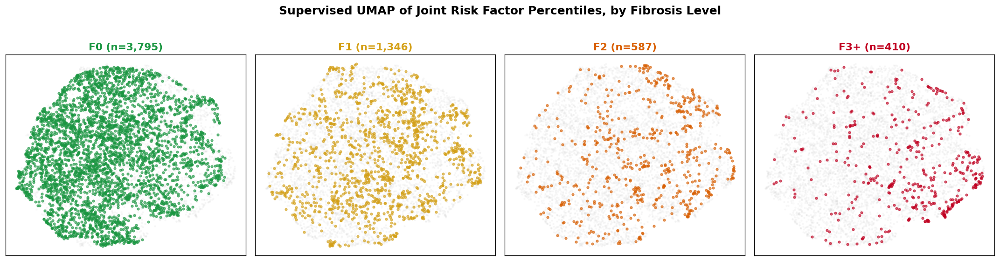

In [8]:
# --- Static UMAP scatter, colored by fibrosis level ---
fig, axes = plt.subplots(1, 4, figsize=(18, 4.5))

for ax, fib in zip(axes, FIBROSIS_LABELS):
    ax.scatter(complete['UMAP1'], complete['UMAP2'],
               s=UMAP_BG_SIZE, alpha=UMAP_BG_ALPHA, color='lightgray', rasterized=True)
    mask = complete['FIBROSIS'] == fib
    ax.scatter(complete.loc[mask, 'UMAP1'], complete.loc[mask, 'UMAP2'],
               s=UMAP_FG_SIZE, alpha=UMAP_FG_ALPHA, color=FIBROSIS_COLORS[fib],
               rasterized=True)
    n = mask.sum()
    ax.set_title(f'{fib} (n={n:,})', fontweight='bold', color=FIBROSIS_COLORS[fib])
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle('Supervised UMAP of Joint Risk Factor Percentiles, by Fibrosis Level',
             fontsize=FONT_TITLE, fontweight='bold', y=1.03)
fig.tight_layout()
plt.show()

### UMAP colored by individual risk factor percentiles

To interpret what regions of the UMAP mean, color points by each marginal percentile.

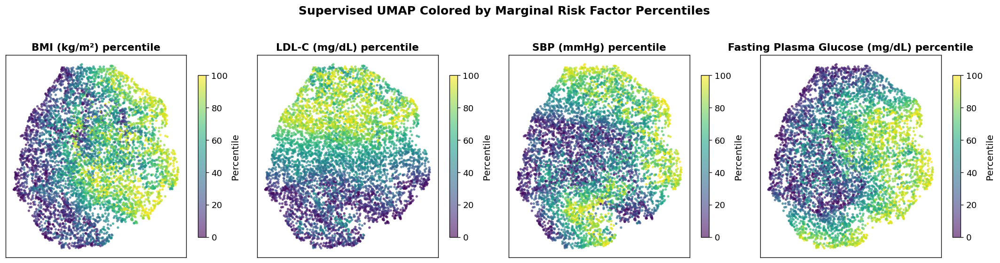

In [9]:
UMAP_RF_ORDER = ['BMXBMI', 'LDL_C', 'SBP_MEAN', 'FPG']

fig, axes = plt.subplots(1, 4, figsize=(18, 4.5))

for ax, col in zip(axes, UMAP_RF_ORDER):
    info = RISK_FACTORS[col]
    pcol = f'{col}_pctile'
    sc = ax.scatter(complete['UMAP1'], complete['UMAP2'],
                    c=complete[pcol], cmap=CMAP, s=UMAP_PCT_SIZE, alpha=UMAP_PCT_ALPHA,
                    vmin=0, vmax=100, rasterized=True)
    ax.set_title(info['label'] + ' percentile', fontweight='bold')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, shrink=0.8, label='Percentile')

fig.suptitle('Supervised UMAP Colored by Marginal Risk Factor Percentiles',
             fontsize=FONT_TITLE, fontweight='bold', y=1.03)
fig.tight_layout()
plt.show()

## 6. Animated GIF: linking 2D embedding to risk factor scatter plots

The animation cycles through highlighted individuals from each fibrosis level.
The UMAP (left) is colored by BMI percentile, with the current fibrosis group
circled in gray and the featured individual circled in red. Two scatter plots
(right) show BMI vs FPG and SBP vs LDL-C, with lines connecting the UMAP
position to the corresponding points in each scatter.

In [10]:
import imageio.v3 as iio
from io import BytesIO
from matplotlib.patches import ConnectionPatch

os.makedirs('outputs', exist_ok=True)

# Select sample individuals per fibrosis level for animation
rng = np.random.RandomState(42)
sample_indices = {}
for fib in FIBROSIS_LABELS:
    fib_idx = complete.index[complete['FIBROSIS'] == fib]
    chosen = rng.choice(fib_idx, size=min(GIF_N_PER_LEVEL, len(fib_idx)), replace=False)
    sample_indices[fib] = chosen

# Scatter plot axis ranges (with a little padding)
def padded_range(s, pad=0.03):
    lo, hi = s.quantile(0.005), s.quantile(0.995)
    margin = (hi - lo) * pad
    return lo - margin, hi + margin

bmi_range = padded_range(complete['BMXBMI'])
fpg_range = padded_range(complete['FPG'])
sbp_range = padded_range(complete['SBP_MEAN'])
ldl_range = padded_range(complete['LDL_C'])


def make_frame(fib_level, person_idx, frame_num, total_frames):
    """Create one 16:9 frame: BMI-colored UMAP left, two scatter plots right."""
    person = complete.loc[person_idx]

    fig = plt.figure(figsize=(13.33, 7.5))
    gs = fig.add_gridspec(2, 2, width_ratios=[1.3, 1], hspace=0.35, wspace=0.30,
                          left=0.05, right=0.96, top=0.90, bottom=0.07)

    # ── Left: UMAP colored by BMI percentile (spans both rows) ──
    ax_umap = fig.add_subplot(gs[:, 0])
    sc = ax_umap.scatter(complete['UMAP1'], complete['UMAP2'],
                         c=complete['BMXBMI_pctile'], cmap=CMAP,
                         s=ANIM_BG_SIZE, alpha=ANIM_BG_ALPHA,
                         vmin=0, vmax=100, rasterized=True, zorder=1)
    plt.colorbar(sc, ax=ax_umap, shrink=0.6, label='BMI percentile', pad=0.02)

    # Grey circle outlines for current fibrosis level
    fib_mask = complete['FIBROSIS'] == fib_level
    ax_umap.scatter(complete.loc[fib_mask, 'UMAP1'], complete.loc[fib_mask, 'UMAP2'],
                    s=ANIM_GRP_SIZE, facecolors='none', edgecolors='gray',
                    linewidths=ANIM_GRP_LW, alpha=ANIM_GRP_ALPHA, zorder=2)

    # Red circle outline for selected individual
    ax_umap.scatter(person['UMAP1'], person['UMAP2'],
                    s=ANIM_SEL_SIZE, facecolors='none', edgecolors=ANIM_ARR_COLOR,
                    linewidths=ANIM_SEL_LW, zorder=10)

    ax_umap.set_title(f'UMAP — {fib_level} group circled',
                      fontsize=FONT_SUBTITLE, fontweight='bold',
                      color=FIBROSIS_COLORS[fib_level])
    ax_umap.set_xticks([])
    ax_umap.set_yticks([])

    # ── Top right: BMI vs FPG scatter ──
    ax_bf = fig.add_subplot(gs[0, 1])
    ax_bf.scatter(complete['BMXBMI'], complete['FPG'],
                  c=complete['BMXBMI_pctile'], cmap=CMAP,
                  s=ANIM_SC_SIZE, alpha=ANIM_SC_ALPHA,
                  vmin=0, vmax=100, rasterized=True, zorder=1)
    if pd.notna(person['BMXBMI']) and pd.notna(person['FPG']):
        ax_bf.scatter(person['BMXBMI'], person['FPG'],
                      s=ANIM_SC_SEL_SZ, facecolors='none', edgecolors=ANIM_ARR_COLOR,
                      linewidths=ANIM_SC_SEL_LW, zorder=10)
    ax_bf.set_xlabel('BMI (kg/m²)')
    ax_bf.set_ylabel('FPG (mg/dL)')
    ax_bf.set_title('BMI vs. Fasting Glucose', fontweight='bold')
    ax_bf.set_xlim(*bmi_range)
    ax_bf.set_ylim(*fpg_range)

    # ── Bottom right: SBP vs LDL-C scatter ──
    ax_sl = fig.add_subplot(gs[1, 1])
    ax_sl.scatter(complete['SBP_MEAN'], complete['LDL_C'],
                  c=complete['BMXBMI_pctile'], cmap=CMAP,
                  s=ANIM_SC_SIZE, alpha=ANIM_SC_ALPHA,
                  vmin=0, vmax=100, rasterized=True, zorder=1)
    if pd.notna(person['SBP_MEAN']) and pd.notna(person['LDL_C']):
        ax_sl.scatter(person['SBP_MEAN'], person['LDL_C'],
                      s=ANIM_SC_SEL_SZ, facecolors='none', edgecolors=ANIM_ARR_COLOR,
                      linewidths=ANIM_SC_SEL_LW, zorder=10)
    ax_sl.set_xlabel('SBP (mmHg)')
    ax_sl.set_ylabel('LDL-C (mg/dL)')
    ax_sl.set_title('SBP vs. LDL-C', fontweight='bold')
    ax_sl.set_xlim(*sbp_range)
    ax_sl.set_ylim(*ldl_range)

    fig.suptitle(f'{fib_level} individual — age {person["AGE"]:.0f}, {person["SEX"]}   '
                 f'(frame {frame_num+1}/{total_frames})',
                 fontsize=FONT_SUBTITLE + 1, fontweight='bold')

    # ── Connecting arrows across axes ──
    umap_xy = (person['UMAP1'], person['UMAP2'])
    for ax_target, xcol, ycol in [(ax_bf, 'BMXBMI', 'FPG'),
                                   (ax_sl, 'SBP_MEAN', 'LDL_C')]:
        xval, yval = person[xcol], person[ycol]
        if pd.notna(xval) and pd.notna(yval):
            con = ConnectionPatch(
                xyA=umap_xy, coordsA=ax_umap.transData,
                xyB=(xval, yval), coordsB=ax_target.transData,
                arrowstyle='->', mutation_scale=15,
                color=ANIM_ARR_COLOR, lw=ANIM_ARR_LW, alpha=ANIM_ARR_ALPHA,
                zorder=20, connectionstyle=f'arc3,rad={ANIM_ARR_RAD}',
            )
            fig.add_artist(con)

    buf = BytesIO()
    fig.savefig(buf, format='png', dpi=GIF_DPI, bbox_inches='tight',
                facecolor='white', edgecolor='none')
    plt.close(fig)
    buf.seek(0)
    return iio.imread(buf)


# Generate all frames
frames_list = []
total = sum(len(v) for v in sample_indices.values())
frame_num = 0
for fib in FIBROSIS_LABELS:
    for idx in sample_indices[fib]:
        frames_list.append(make_frame(fib, idx, frame_num, total))
        frame_num += 1
        if frame_num % 8 == 0:
            print(f"  {frame_num}/{total} frames rendered")

# Save GIF
gif_path = os.path.join('outputs', 'umap_marginals_animation.gif')
iio.imwrite(gif_path, frames_list, duration=GIF_DURATION_MS, loop=0)
print(f"\nSaved {len(frames_list)}-frame GIF to {gif_path}")
print(f"  File size: {os.path.getsize(gif_path)/1e6:.1f} MB")

  8/32 frames rendered


  16/32 frames rendered


  24/32 frames rendered


  32/32 frames rendered



Saved 32-frame GIF to outputs/umap_marginals_animation.gif
  File size: 7.2 MB


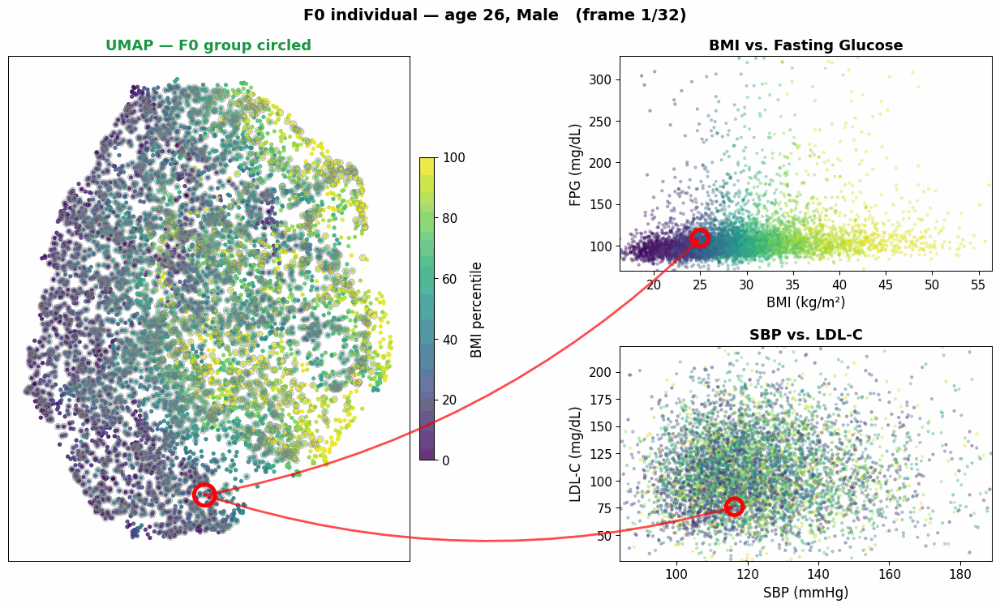

In [11]:
from IPython.display import Image, display as ipy_display
ipy_display(Image(filename=gif_path))

## 7. Joint distribution with continuous liver stiffness and treatment indicators

Repeat the UMAP embedding of joint risk factor percentiles, but replace the
categorical fibrosis staging with **continuous liver stiffness (LSM, kPa)** and
add binary indicators for medication treatment of each risk factor:

| Treatment | Source file | Variable (2017–2020 / 2021–2022) | Coding |
|---|---|---|---|
| Antihypertensives (SBP) | BPQ | `BPQ040A` / `BPQ150` | 1 = Yes |
| Cholesterol-lowering (LDL-C) | BPQ | `BPQ100D` / `BPQ101D` | 1 = Yes |
| Insulin | DIQ | `DIQ050` | 1 = Yes |
| Diabetes pills (FPG) | DIQ | `DIQ070` | 1 = Yes |

NHANES does not include a direct question about anti-obesity medication, so BMI
treatment is omitted.  We combine insulin and diabetes pills into a single
"diabetes treatment" indicator.

In [12]:
# ── Load BPQ and DIQ questionnaire files ──────────────────────────
tx_cycles = [
    {'raw_dir': '2017_2020_prepandemic',
     'bpq': 'P_BPQ.xpt',  'bp_med': 'BPQ040A', 'chol_med': 'BPQ100D',
     'diq': 'P_DIQ.xpt'},
    {'raw_dir': '2021_2022',
     'bpq': 'BPQ_L.xpt',  'bp_med': 'BPQ150',  'chol_med': 'BPQ101D',
     'diq': 'DIQ_L.xpt'},
]

tx_frames = []
for cyc in tx_cycles:
    raw_dir = os.path.join(RAW_NHANES, cyc['raw_dir'])

    # Blood Pressure & Cholesterol questionnaire
    bpq = read_xpt(os.path.join(raw_dir, cyc['bpq']))
    bpq['TX_BP']   = (bpq[cyc['bp_med']] == 1).astype(float)
    bpq['TX_CHOL'] = (bpq[cyc['chol_med']] == 1).astype(float)
    # People not asked (no prior diagnosis) are untreated
    bpq['TX_BP']   = bpq['TX_BP'].fillna(0)
    bpq['TX_CHOL'] = bpq['TX_CHOL'].fillna(0)

    # Diabetes questionnaire
    diq = read_xpt(os.path.join(raw_dir, cyc['diq']))
    diq['TX_INSULIN'] = (diq['DIQ050'] == 1).astype(float).fillna(0)
    diq['TX_DM_PILLS'] = (diq['DIQ070'] == 1).astype(float).fillna(0)
    diq['TX_DIABETES'] = ((diq['TX_INSULIN'] == 1) | (diq['TX_DM_PILLS'] == 1)).astype(float)

    tx = bpq[['SEQN', 'TX_BP', 'TX_CHOL']].merge(
        diq[['SEQN', 'TX_INSULIN', 'TX_DM_PILLS', 'TX_DIABETES']],
        on='SEQN', how='outer'
    )
    tx_frames.append(tx)
    print(f"{cyc['raw_dir']}: {len(tx):,} with treatment data")

tx_all = pd.concat(tx_frames, ignore_index=True)

# Merge into pool
pool = pool.merge(tx_all, on='SEQN', how='left')
for col in ['TX_BP', 'TX_CHOL', 'TX_INSULIN', 'TX_DM_PILLS', 'TX_DIABETES']:
    pool[col] = pool[col].fillna(0)

print(f"\nTreatment prevalence among {len(pool):,} adults with valid LSM:")
for col, label in [('TX_BP', 'Antihypertensives'),
                   ('TX_CHOL', 'Cholesterol-lowering'),
                   ('TX_DIABETES', 'Diabetes (insulin or pills)')]:
    n = int(pool[col].sum())
    print(f"  {label}: {n:,} ({n/len(pool)*100:.1f}%)")

# Complete cases: all 4 risk factor percentiles available
complete_tx = pool.dropna(subset=pctile_cols).copy()
print(f"\nComplete cases (all 4 risk factors + treatment data): {len(complete_tx):,}")

2017_2020_prepandemic: 14,986 with treatment data
2021_2022: 11,744 with treatment data

Treatment prevalence among 13,791 adults with valid LSM:
  Antihypertensives: 4,305 (31.2%)
  Cholesterol-lowering: 3,123 (22.6%)
  Diabetes (insulin or pills): 1,745 (12.7%)

Complete cases (all 4 risk factors + treatment data): 6,138


In [13]:
# ── UMAP: 4 risk-factor percentiles + 3 treatment indicators ─────
# Treatment columns are 0/1; scale percentiles to [0,1] for balance
from sklearn.preprocessing import StandardScaler

feature_cols = pctile_cols + ['TX_BP', 'TX_CHOL', 'TX_DIABETES']
X_tx = StandardScaler().fit_transform(complete_tx[feature_cols].values)

# Supervised UMAP with continuous log(LSM) as target
complete_tx['log_LSM'] = np.log(complete_tx['LSM_KPA'])

reducer_tx = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean',
                       target_weight=0.3, target_metric='l2',
                       random_state=42)
emb_tx = reducer_tx.fit_transform(X_tx, y=complete_tx['log_LSM'].values)
complete_tx['UMAP1_tx'] = emb_tx[:, 0]
complete_tx['UMAP2_tx'] = emb_tx[:, 1]

# Orient so low BMI percentile is on the left
bmi_corr = np.corrcoef(complete_tx['BMXBMI_pctile'], complete_tx['UMAP1_tx'])[0, 1]
if bmi_corr < 0:
    complete_tx['UMAP1_tx'] = -complete_tx['UMAP1_tx']
    print(f'Flipped UMAP1 (BMI correlation was {bmi_corr:.2f}, now positive)')
else:
    print(f'UMAP1 already oriented with BMI (correlation {bmi_corr:.2f})')

print(f'Supervised UMAP (continuous LSM target) computed: {emb_tx.shape}')
print(f'Feature space: {len(feature_cols)} dimensions — '
      f'{len(pctile_cols)} percentiles + 3 treatment indicators')

/home/abie/miniforge3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Flipped UMAP1 (BMI correlation was -0.38, now positive)
Supervised UMAP (continuous LSM target) computed: (6138, 2)
Feature space: 7 dimensions — 4 percentiles + 3 treatment indicators


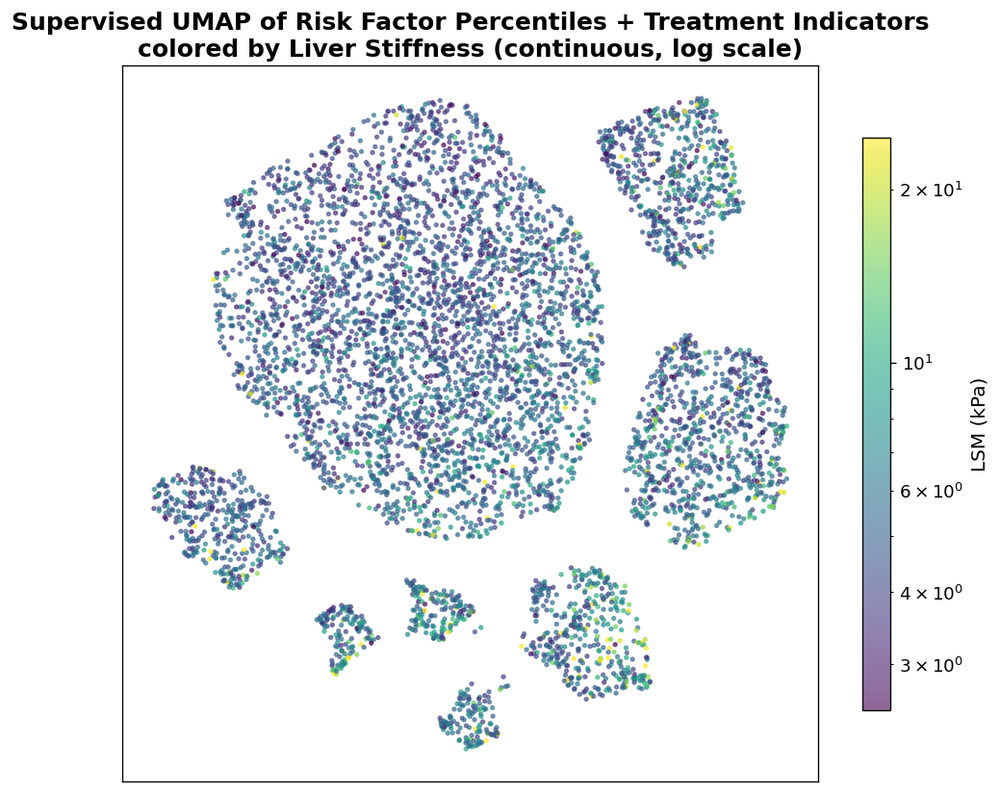

In [14]:
# ── Single UMAP panel colored by continuous LSM (kPa, log scale) ──
fig, ax = plt.subplots(figsize=(8, 7))

sc = ax.scatter(complete_tx['UMAP1_tx'], complete_tx['UMAP2_tx'],
                c=complete_tx['LSM_KPA'], cmap=CMAP,
                norm=plt.matplotlib.colors.LogNorm(
                    vmin=complete_tx['LSM_KPA'].quantile(0.01),
                    vmax=complete_tx['LSM_KPA'].quantile(0.99)),
                s=UMAP_PCT_SIZE, alpha=UMAP_PCT_ALPHA, rasterized=True)
cb = plt.colorbar(sc, ax=ax, shrink=0.8, label='LSM (kPa)')
cb.set_label('LSM (kPa)', fontsize=FONT_LABEL)

ax.set_title('Supervised UMAP of Risk Factor Percentiles + Treatment Indicators\n'
             'colored by Liver Stiffness (continuous, log scale)',
             fontsize=FONT_TITLE, fontweight='bold')
ax.set_xticks([])
ax.set_yticks([])
fig.tight_layout()
plt.show()

### Treatment overlay panels

Each panel highlights individuals on a specific treatment (colored) against
the untreated background (gray).  The fourth panel shows all three
treatments overlaid.

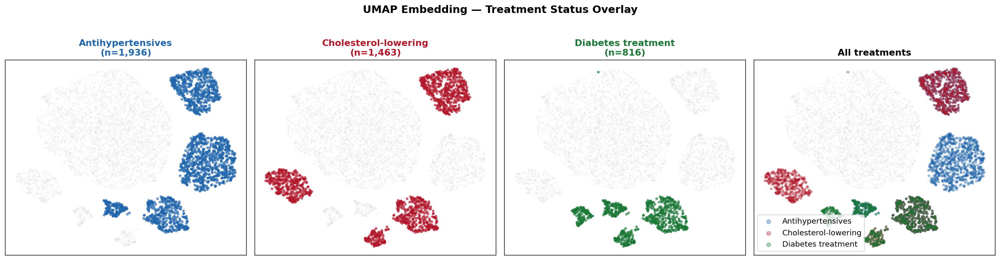

In [15]:
# ── UMAP panels colored by treatment status ──────────────────────
TX_COLORS = {
    'TX_BP':       ('#2166ac', 'Antihypertensives'),
    'TX_CHOL':     ('#b2182b', 'Cholesterol-lowering'),
    'TX_DIABETES': ('#1b7837', 'Diabetes treatment'),
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for ax, (tx_col, (color, label)) in zip(axes[:3], TX_COLORS.items()):
    untreated = complete_tx[tx_col] == 0
    treated = complete_tx[tx_col] == 1

    ax.scatter(complete_tx.loc[untreated, 'UMAP1_tx'],
               complete_tx.loc[untreated, 'UMAP2_tx'],
               s=UMAP_BG_SIZE, alpha=UMAP_BG_ALPHA, color='lightgray',
               rasterized=True)
    ax.scatter(complete_tx.loc[treated, 'UMAP1_tx'],
               complete_tx.loc[treated, 'UMAP2_tx'],
               s=UMAP_FG_SIZE, alpha=UMAP_FG_ALPHA, color=color,
               rasterized=True)
    n = int(treated.sum())
    ax.set_title(f'{label}\n(n={n:,})', fontweight='bold',
                 fontsize=FONT_SUBTITLE, color=color)
    ax.set_xticks([])
    ax.set_yticks([])

# Fourth panel: overlay all three treatments
ax = axes[3]
ax.scatter(complete_tx['UMAP1_tx'], complete_tx['UMAP2_tx'],
           s=UMAP_BG_SIZE, alpha=UMAP_BG_ALPHA, color='lightgray',
           rasterized=True)
for tx_col, (color, label) in TX_COLORS.items():
    treated = complete_tx[tx_col] == 1
    ax.scatter(complete_tx.loc[treated, 'UMAP1_tx'],
               complete_tx.loc[treated, 'UMAP2_tx'],
               s=UMAP_FG_SIZE, alpha=UMAP_FG_ALPHA * 0.6, color=color,
               rasterized=True, label=label)
ax.legend(fontsize=FONT_LEGEND, markerscale=2, loc='best')
ax.set_title('All treatments', fontweight='bold', fontsize=FONT_SUBTITLE)
ax.set_xticks([])
ax.set_yticks([])

fig.suptitle('UMAP Embedding — Treatment Status Overlay',
             fontsize=FONT_TITLE, fontweight='bold', y=1.03)
fig.tight_layout()
plt.show()

### Risk factor percentile coloring (with treatment in embedding)

Same approach as section 5, but the embedding now incorporates treatment
status and the colorbar shows where treated individuals land.

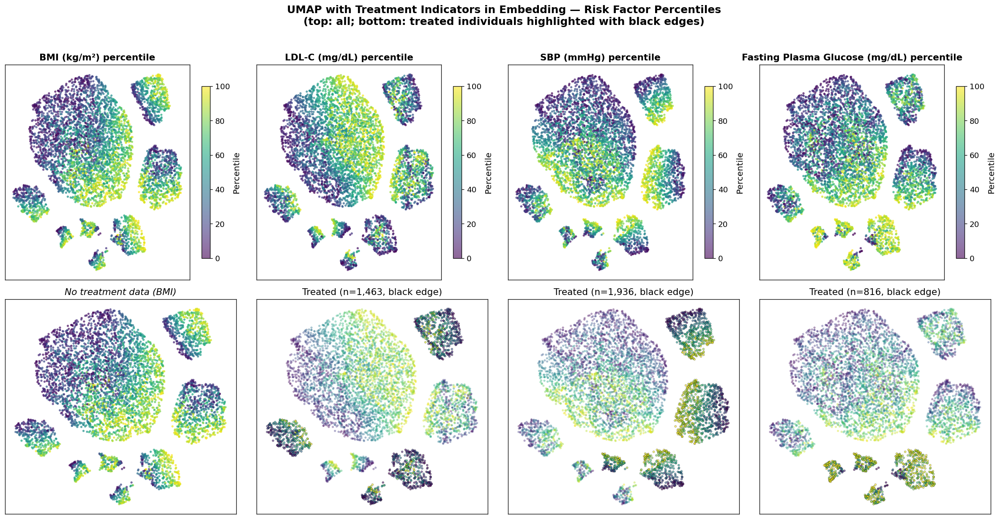

In [16]:
# ── UMAP colored by each risk factor percentile (new embedding) ──
UMAP_RF_ORDER_TX = ['BMXBMI', 'LDL_C', 'SBP_MEAN', 'FPG']
TX_FOR_RF = {'SBP_MEAN': 'TX_BP', 'LDL_C': 'TX_CHOL',
             'FPG': 'TX_DIABETES', 'BMXBMI': None}

fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for j, col in enumerate(UMAP_RF_ORDER_TX):
    info = RISK_FACTORS[col]
    pcol = f'{col}_pctile'

    # Top row: colored by percentile (all points)
    ax = axes[0, j]
    sc = ax.scatter(complete_tx['UMAP1_tx'], complete_tx['UMAP2_tx'],
                    c=complete_tx[pcol], cmap=CMAP,
                    s=UMAP_PCT_SIZE, alpha=UMAP_PCT_ALPHA,
                    vmin=0, vmax=100, rasterized=True)
    ax.set_title(info['label'] + ' percentile',
                 fontweight='bold', fontsize=FONT_SUBTITLE)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, shrink=0.8, label='Percentile')

    # Bottom row: treated vs untreated for this risk factor
    ax = axes[1, j]
    tx_col = TX_FOR_RF[col]
    if tx_col is not None:
        untreated = complete_tx[tx_col] == 0
        treated = complete_tx[tx_col] == 1
        ax.scatter(complete_tx.loc[untreated, 'UMAP1_tx'],
                   complete_tx.loc[untreated, 'UMAP2_tx'],
                   c=complete_tx.loc[untreated, pcol], cmap=CMAP,
                   s=UMAP_PCT_SIZE, alpha=UMAP_PCT_ALPHA * 0.5,
                   vmin=0, vmax=100, rasterized=True)
        ax.scatter(complete_tx.loc[treated, 'UMAP1_tx'],
                   complete_tx.loc[treated, 'UMAP2_tx'],
                   c=complete_tx.loc[treated, pcol], cmap=CMAP,
                   s=UMAP_FG_SIZE, alpha=UMAP_FG_ALPHA,
                   vmin=0, vmax=100, rasterized=True,
                   edgecolors='black', linewidths=0.3)
        n_tx = int(treated.sum())
        ax.set_title(f'Treated (n={n_tx:,}, black edge)',
                     fontsize=FONT_SUBTITLE)
    else:
        ax.scatter(complete_tx['UMAP1_tx'], complete_tx['UMAP2_tx'],
                   c=complete_tx[pcol], cmap=CMAP,
                   s=UMAP_PCT_SIZE, alpha=UMAP_PCT_ALPHA,
                   vmin=0, vmax=100, rasterized=True)
        ax.set_title('No treatment data (BMI)',
                     fontsize=FONT_SUBTITLE, fontstyle='italic')
    ax.set_xticks([])
    ax.set_yticks([])

fig.suptitle('UMAP with Treatment Indicators in Embedding — '
             'Risk Factor Percentiles\n'
             '(top: all; bottom: treated individuals highlighted with black edges)',
             fontsize=FONT_TITLE, fontweight='bold', y=1.02)
fig.tight_layout()
plt.show()

### Treatment prevalence and risk factor means by LSM quartile

Summarize how treatment prevalence and mean risk factor values change across
the continuous LSM distribution.

In [17]:
# ── Treatment prevalence and risk factor means by LSM quartile ───
complete_tx['LSM_quartile'] = pd.qcut(
    complete_tx['LSM_KPA'], q=4,
    labels=['Q1 (lowest)', 'Q2', 'Q3', 'Q4 (highest)']
)

summary_cols = {
    'LSM_KPA':      'LSM (kPa)',
    'BMXBMI':       'BMI (kg/m²)',
    'SBP_MEAN':     'SBP (mmHg)',
    'LDL_C':        'LDL-C (mg/dL)',
    'FPG':          'FPG (mg/dL)',
    'TX_BP':        '% on antihypertensives',
    'TX_CHOL':      '% on cholesterol meds',
    'TX_DIABETES':  '% on diabetes treatment',
}

rows = []
for q_label, grp in complete_tx.groupby('LSM_quartile', observed=True):
    row = {'LSM quartile': q_label, 'n': len(grp)}
    for col, label in summary_cols.items():
        val = grp[col].mean()
        if col.startswith('TX_'):
            row[label] = f'{val*100:.1f}%'
        else:
            row[label] = f'{val:.1f}'
    # CI for LSM (kPa)
    lsm_lo, lsm_hi = grp['LSM_KPA'].quantile([0.25, 0.75])
    row['LSM (kPa)'] = f"{grp['LSM_KPA'].mean():.1f} [{lsm_lo:.1f}–{lsm_hi:.1f}]"
    rows.append(row)

summary_df = pd.DataFrame(rows).set_index('LSM quartile')
display(summary_df)

,n,LSM (kPa),BMI (kg/m²),SBP (mmHg),LDL-C (mg/dL),FPG (mg/dL),% on antihypertensives,% on cholesterol meds,% on diabetes treatment
LSM quartile,,,,,,,,,
Q1 (lowest),1687,3.5 [3.3–3.9],27.2,119.7,111.7,104.0,25.0%,20.1%,7.1%
Q2,1500,4.6 [4.4–4.8],28.0,121.7,109.6,107.4,28.5%,21.7%,10.7%
Q3,1419,5.6 [5.3–5.8],29.5,123.7,108.9,109.8,30.6%,24.1%,12.5%
Q4 (highest),1532,10.2 [6.7–9.8],33.0,125.9,104.8,121.3,42.6%,29.8%,23.3%
